# CT Slice Quality Assessment with VLLM
Adapted from the LabelCritic repo. This notebook:
1. Loads 5 random CT slices from a specified folder.
2. Prepares a prompt asking the VLLM to rate image quality (1–5).
3. Sends the prompt and images to the VLLM server.
4. Prints out the model's response.


In [1]:
import os
import random
from PIL import Image
from io import BytesIO
import base64
import requests
from ErrorDetector import CreateConversation  # assumes LabelCritic repo is in your PYTHONPATH

def encode_image(img_path, solid_overlay=False):
    image = Image.open(img_path).convert("RGB")
    buffered = BytesIO()
    image.save(buffered, format="PNG")
    return base64.b64encode(buffered.getvalue()).decode("utf-8")

In [2]:
# === Configuration ===
ct_slice_dir = "/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/"  # <-- CHANGE THIS
vllm_url = "http://localhost:8000/v1/chat/completions"  # Update if your VLLM uses a different port

prompt_text = "Give score 1–5, how good is the image quality?"
num_slices = 5

In [3]:
# === Sample 5 random CT slices ===
all_slices = [os.path.join(ct_slice_dir, f) for f in os.listdir(ct_slice_dir) if f.lower().endswith(('.png', '.jpg'))]
sampled_slices = random.sample(all_slices, num_slices)

for s in sampled_slices:
    print(f"Selected: {s}")

Selected: /home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice2.png
Selected: /home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice4.png
Selected: /home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice1.png
Selected: /home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice5.png
Selected: /home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice3.png


img_file_list: ['/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice2.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice4.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice1.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice5.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice3.png']


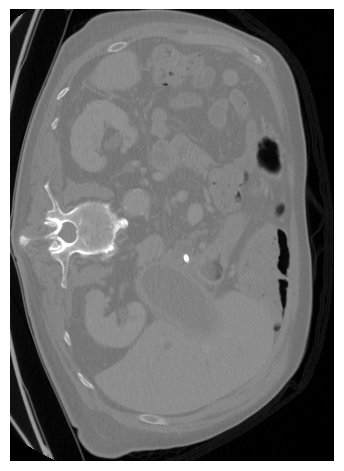

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (324, 452), File Size: 118308 bytes


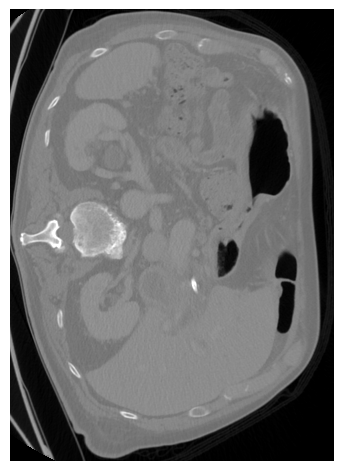

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (324, 452), File Size: 118160 bytes


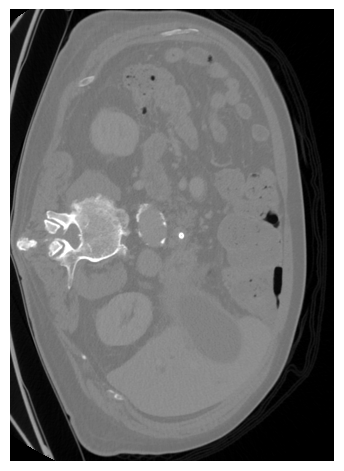

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (324, 452), File Size: 117449 bytes


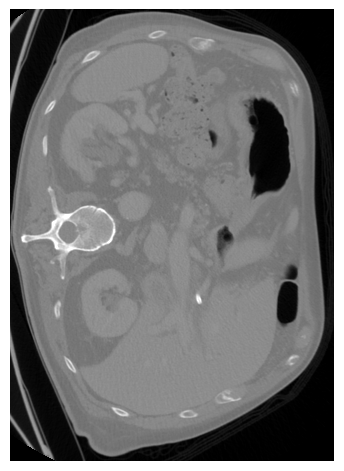

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (324, 452), File Size: 119536 bytes


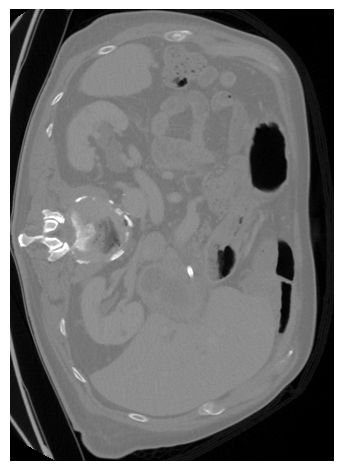

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (324, 452), File Size: 118896 bytes


In [4]:
# === Create VLLM conversation ===
conversation = CreateConversation(
    img_file_list=sampled_slices,
    text=prompt_text,
    conver=[],
    prt=True
)

In [5]:
# === Send prompt to VLLM ===
payload = {
    "model": "Qwen/Qwen2-VL-72B-Instruct-AWQ",  # <-- must match what you loaded
    "messages": conversation,  # still fine if format matches
    "temperature": 0.2
}

response = requests.post(vllm_url, json=payload)
response.raise_for_status()
print("Model response:")
print(response.json()["choices"][0]["message"]["content"])

Model response:
The image quality appears to be quite good. The details of the internal structures are clearly visible, and the contrast between different tissues is well-defined. Therefore, I would give this image a score of 4 out of 5.


## Full Pipeline - from loading the folders to the output

⚠️ No slices found for .ipynb_checkpoints
img_file_list: ['/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice1.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice2.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice3.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice4.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000087/BDMAP_00000087_slice5.png']


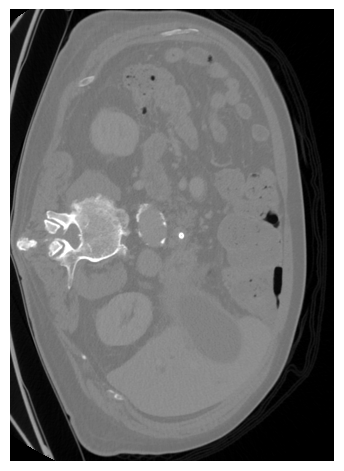

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (324, 452), File Size: 117449 bytes


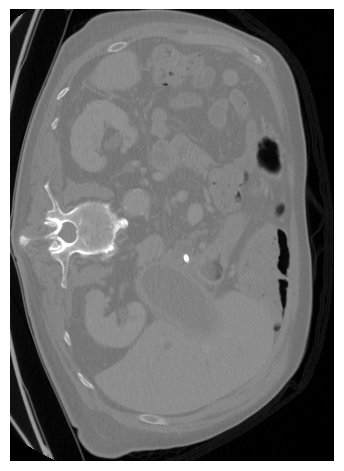

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (324, 452), File Size: 118308 bytes


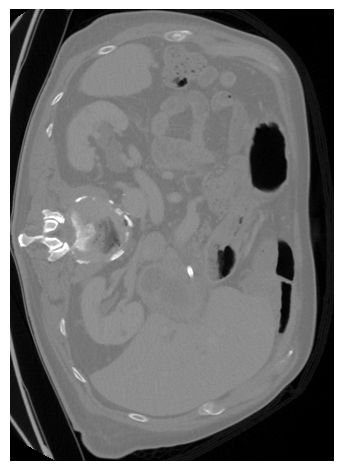

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (324, 452), File Size: 118896 bytes


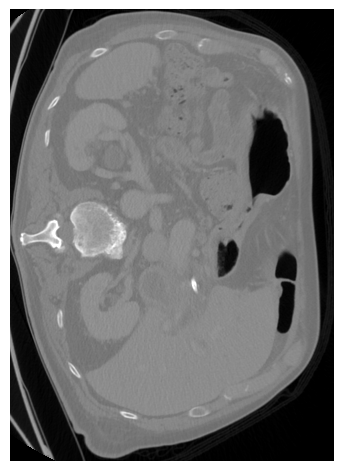

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (324, 452), File Size: 118160 bytes


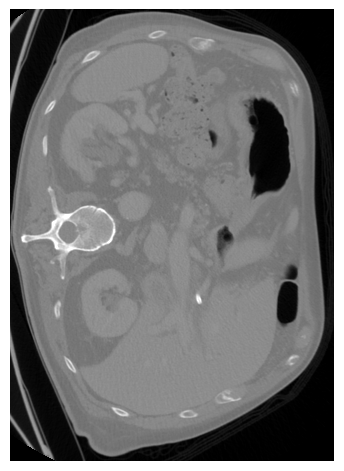

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (324, 452), File Size: 119536 bytes

📌 Patient BDMAP_00000087 response:
The image quality appears to be quite good. The details of the internal structures are clearly visible, and the contrast is well-balanced. Therefore, I would give this image a score of 4 out of 5.

img_file_list: ['/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000093/BDMAP_00000093_slice1.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000093/BDMAP_00000093_slice2.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000093/BDMAP_00000093_slice3.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000093/BDMAP_00000093_slice4.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000093/BDMAP_00000093_slice5.png']


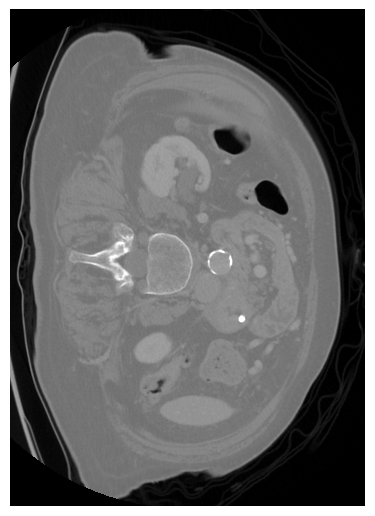

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (355, 497), File Size: 129790 bytes


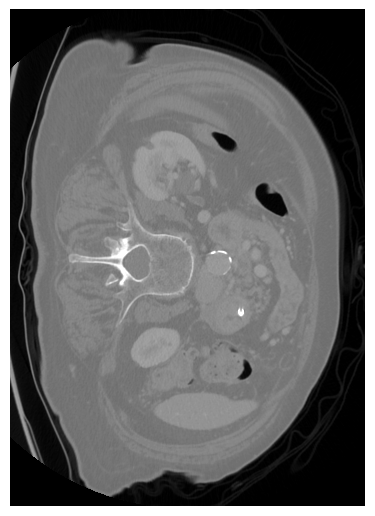

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (355, 497), File Size: 130407 bytes


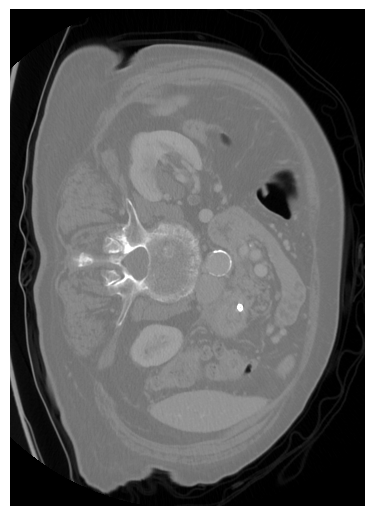

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (355, 497), File Size: 130589 bytes


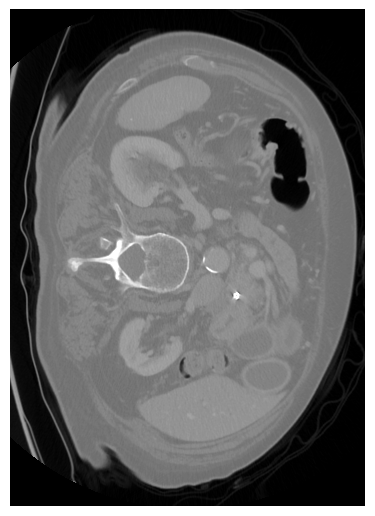

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (355, 497), File Size: 133330 bytes


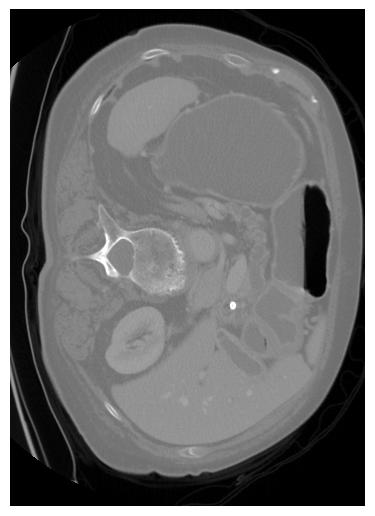

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (355, 497), File Size: 130959 bytes

📌 Patient BDMAP_00000093 response:
The image quality appears to be good, with clear and detailed structures visible. I would rate it a 4 out of 5.

img_file_list: ['/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000192/BDMAP_00000192_slice1.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000192/BDMAP_00000192_slice2.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000192/BDMAP_00000192_slice3.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000192/BDMAP_00000192_slice4.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000192/BDMAP_00000192_slice5.png']


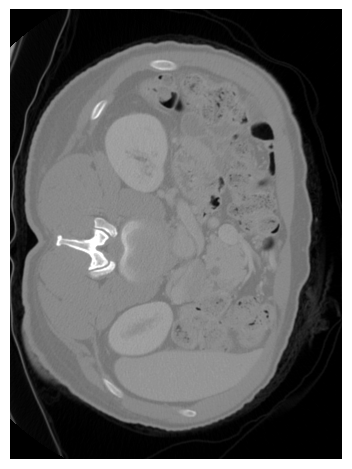

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (332, 450), File Size: 111585 bytes


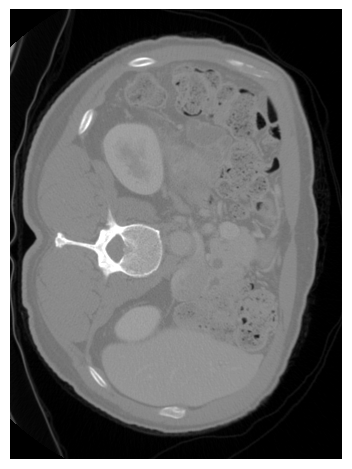

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (332, 450), File Size: 113445 bytes


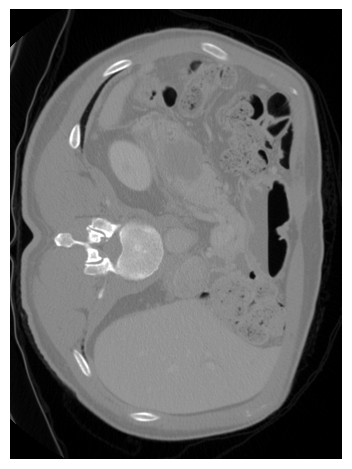

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (332, 450), File Size: 119769 bytes


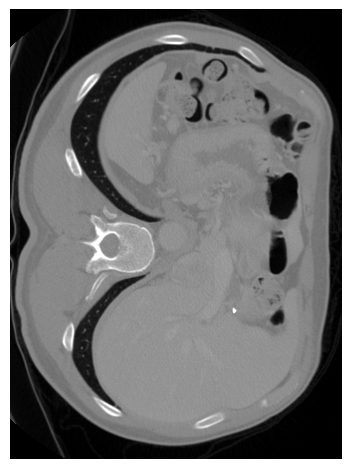

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (332, 450), File Size: 125030 bytes


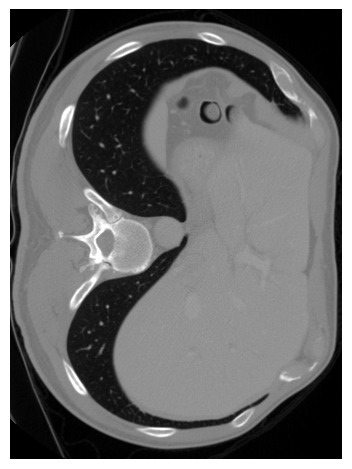

Top pixel: (0, 0, 0, 255)
Image Size (WxH) in prompt: (332, 450), File Size: 124529 bytes

📌 Patient BDMAP_00000192 response:
The image quality appears to be quite good. The details of the internal structures are clearly visible, and the contrast is well-balanced. Therefore, I would give this image a score of 4 out of 5.

img_file_list: ['/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000225/BDMAP_00000225_slice1.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000225/BDMAP_00000225_slice2.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000225/BDMAP_00000225_slice3.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000225/BDMAP_00000225_slice4.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices/BDMAP_00000225/BDMAP_00000225_slice5.png']


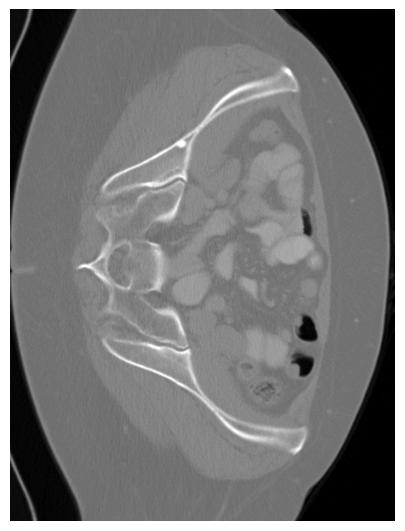

Top pixel: (10, 10, 10, 255)
Image Size (WxH) in prompt: (385, 512), File Size: 142620 bytes


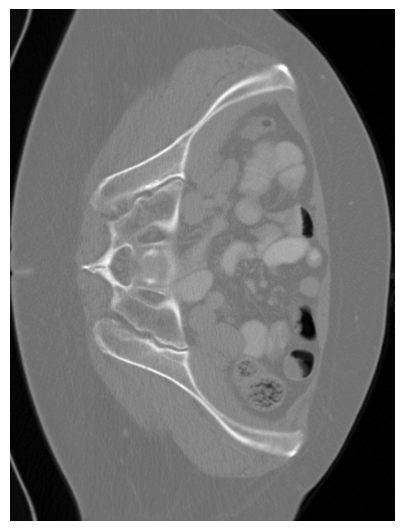

Top pixel: (11, 11, 11, 255)
Image Size (WxH) in prompt: (385, 512), File Size: 142252 bytes


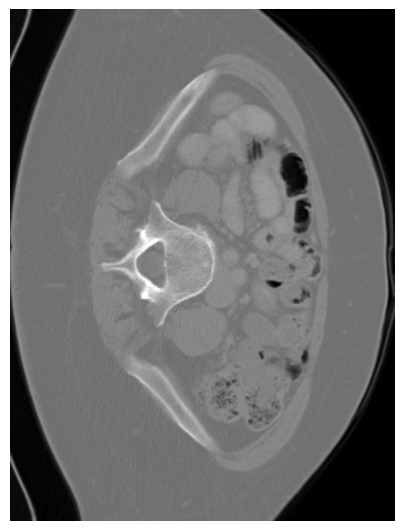

Top pixel: (10, 10, 10, 255)
Image Size (WxH) in prompt: (385, 512), File Size: 140457 bytes


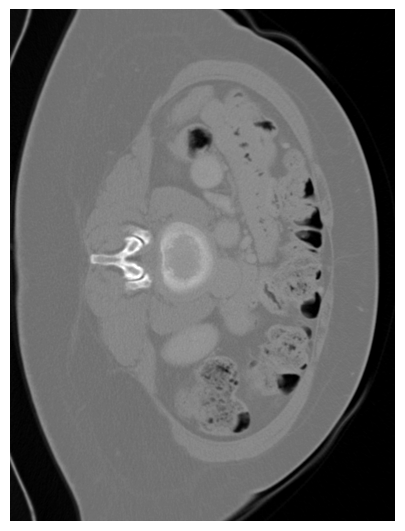

Top pixel: (10, 10, 10, 255)
Image Size (WxH) in prompt: (385, 512), File Size: 139454 bytes


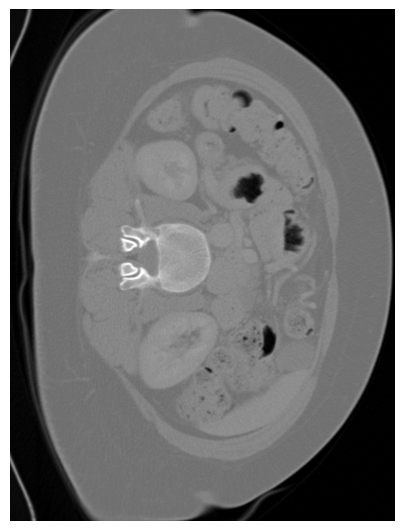

Top pixel: (9, 9, 9, 255)
Image Size (WxH) in prompt: (385, 512), File Size: 135132 bytes

📌 Patient BDMAP_00000225 response:
The image quality appears to be quite good. The details of the internal structures are clearly visible, and the contrast is well-balanced. The resolution seems high enough to distinguish fine details. Based on these observations, I would give this image a score of 4 out of 5.



In [6]:
import os
from glob import glob

base_dir = "/home/ubuntu/Touchstone/data/mvp_ct_slices"  # 🔁 update this
patient_dirs = sorted(os.listdir(base_dir))

for patient_id in patient_dirs:
    slice_paths = sorted(glob(os.path.join(base_dir, patient_id, "*.png")))
    
    if len(slice_paths) == 0:
        print(f"⚠️ No slices found for {patient_id}")
        continue

    conversation = CreateConversation(
        img_file_list=slice_paths,
        text="Give score 1–5, how good is the image quality?",
        conver=[]
    )

    payload = {
        "model": "Qwen/Qwen2-VL-72B-Instruct-AWQ",
        "messages": conversation,
        "temperature": 0.2
    }

    response = requests.post(vllm_url, json=payload)
    try:
        response.raise_for_status()
        content = response.json()["choices"][0]["message"]["content"]
        print(f"\n📌 Patient {patient_id} response:\n{content}\n")
    except requests.exceptions.HTTPError as e:
        print(f"\n❌ Error for patient {patient_id}: {e}")
        print(response.text)

## Noise Test

Model says 4/5 for all CTs. 

In [7]:
import os
from PIL import Image
import numpy as np
from glob import glob
from pathlib import Path

def add_gaussian_noise(image, std=25):
    img_np = np.array(image).astype(np.int16)
    noise = np.random.normal(0, std, img_np.shape).astype(np.int16)
    noisy_img = np.clip(img_np + noise, 0, 255).astype(np.uint8)
    return Image.fromarray(noisy_img)

# === Paths ===
input_root = "/home/ubuntu/Touchstone/data/mvp_ct_slices"
output_root = "/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy"
os.makedirs(output_root, exist_ok=True)

# === Process all patient folders ===
patient_dirs = sorted(os.listdir(input_root))

for patient_id in patient_dirs:
    input_dir = os.path.join(input_root, patient_id)
    output_dir = os.path.join(output_root, patient_id)
    os.makedirs(output_dir, exist_ok=True)

    slice_paths = sorted(glob(os.path.join(input_dir, "*.png")))
    for slice_path in slice_paths:
        img = Image.open(slice_path).convert("RGB")
        noisy_img = add_gaussian_noise(img)

        output_path = os.path.join(output_dir, os.path.basename(slice_path))
        noisy_img.save(output_path)

        print(f"Saved noisy image: {output_path}")

Saved noisy image: /home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000087/BDMAP_00000087_slice1.png
Saved noisy image: /home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000087/BDMAP_00000087_slice2.png
Saved noisy image: /home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000087/BDMAP_00000087_slice3.png
Saved noisy image: /home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000087/BDMAP_00000087_slice4.png
Saved noisy image: /home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000087/BDMAP_00000087_slice5.png
Saved noisy image: /home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000093/BDMAP_00000093_slice1.png
Saved noisy image: /home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000093/BDMAP_00000093_slice2.png
Saved noisy image: /home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000093/BDMAP_00000093_slice3.png
Saved noisy image: /home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000093/BDMAP_00000093_slice4.png
Saved noisy image: 

⚠️ No slices found for .ipynb_checkpoints
img_file_list: ['/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000087/BDMAP_00000087_slice1.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000087/BDMAP_00000087_slice2.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000087/BDMAP_00000087_slice3.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000087/BDMAP_00000087_slice4.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000087/BDMAP_00000087_slice5.png']


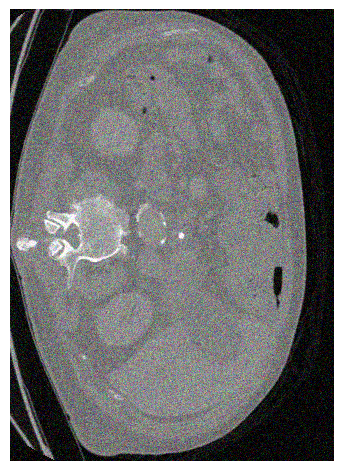

Top pixel: (0, 0, 0)
Image Size (WxH) in prompt: (324, 452), File Size: 387211 bytes


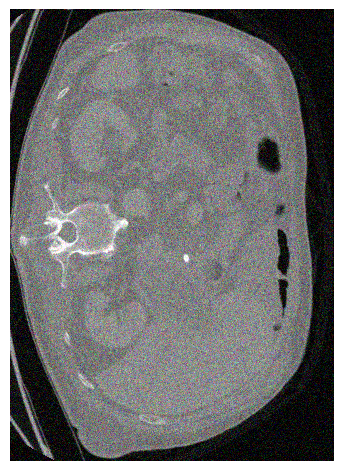

Top pixel: (0, 0, 16)
Image Size (WxH) in prompt: (324, 452), File Size: 388697 bytes


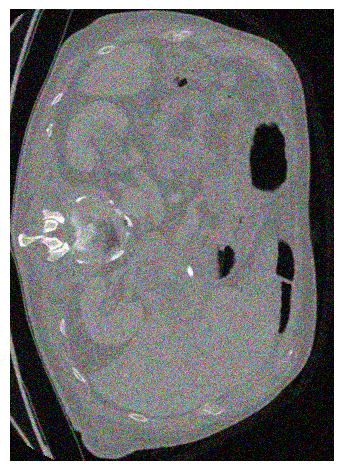

Top pixel: (24, 0, 21)
Image Size (WxH) in prompt: (324, 452), File Size: 388683 bytes


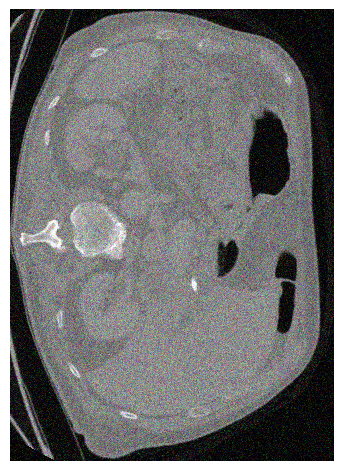

Top pixel: (7, 41, 19)
Image Size (WxH) in prompt: (324, 452), File Size: 388438 bytes


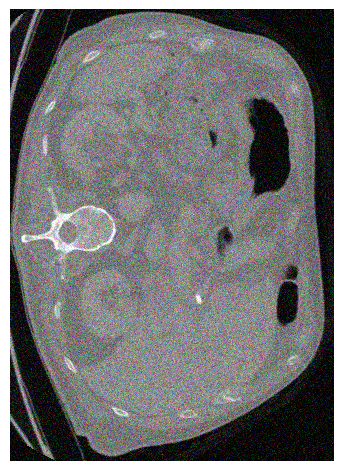

Top pixel: (26, 0, 0)
Image Size (WxH) in prompt: (324, 452), File Size: 387930 bytes

📌 Patient BDMAP_00000087 response:
The image quality in the provided images appears to be quite poor. The images are grainy, with a significant amount of noise and low resolution, making it difficult to discern fine details. The contrast is also low, which further reduces the clarity of the images.

Here is a breakdown of the quality issues:

1. **Noise and Graininess**: The images are very grainy, indicating a high level of noise.
2. **Low Resolution**: The images are not sharp, suggesting a low resolution.
3. **Contrast**: The contrast is low, making it hard to distinguish different structures.
4. **Artifacts**: There are visible artifacts, such as the bright spots and dark areas, which can be distracting and obscure details.

Given these issues, I would rate the image quality as a **1** out of **5**.

img_file_list: ['/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000093/BDMAP_00000093_s

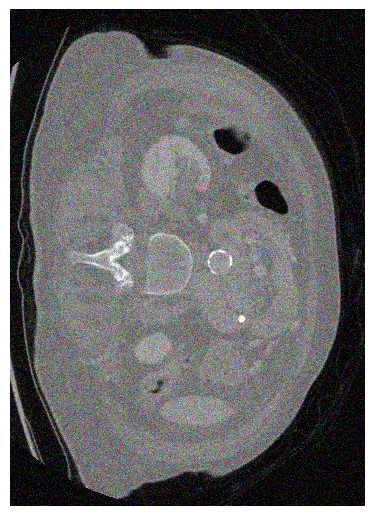

Top pixel: (27, 14, 0)
Image Size (WxH) in prompt: (355, 497), File Size: 454933 bytes


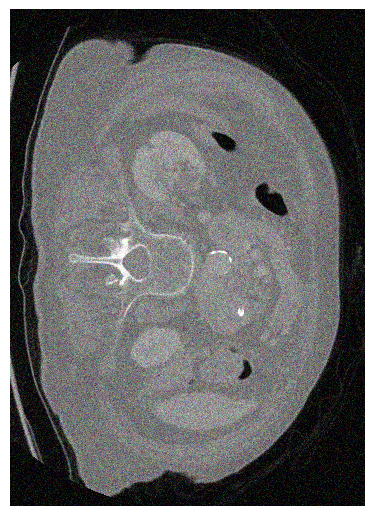

Top pixel: (27, 0, 0)
Image Size (WxH) in prompt: (355, 497), File Size: 453178 bytes


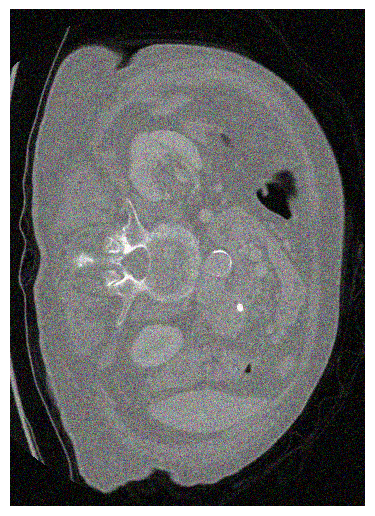

Top pixel: (2, 28, 22)
Image Size (WxH) in prompt: (355, 497), File Size: 451393 bytes


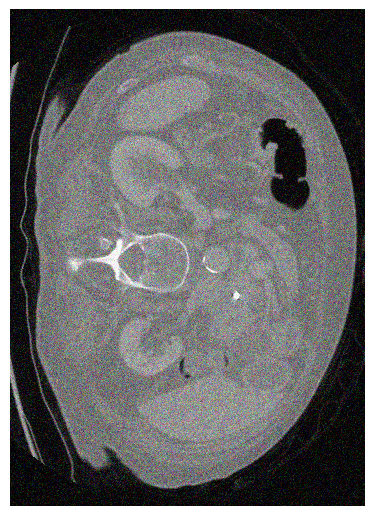

Top pixel: (9, 9, 0)
Image Size (WxH) in prompt: (355, 497), File Size: 453359 bytes


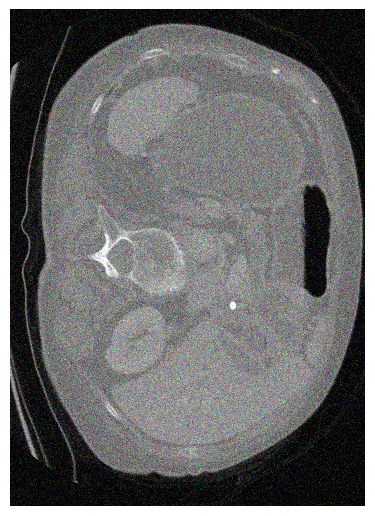

Top pixel: (0, 40, 0)
Image Size (WxH) in prompt: (355, 497), File Size: 453566 bytes

📌 Patient BDMAP_00000093 response:
The image quality of the provided images appears to be quite poor. The images are grainy, with low resolution and poor contrast, making it difficult to discern fine details. The overall appearance suggests that these might be medical imaging scans, possibly CT scans, but the quality is not sufficient for detailed analysis.

Here is a breakdown of the quality issues:

1. **Resolution**: The images are pixelated, indicating a low resolution.
2. **Contrast**: The contrast is poor, making it hard to distinguish different tissues or structures.
3. **Noise**: There is significant noise or graininess in the images.
4. **Artifacts**: There are visible artifacts that could be due to poor image acquisition or processing.

Given these observations, I would rate the image quality as a **1** out of 5.

img_file_list: ['/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000

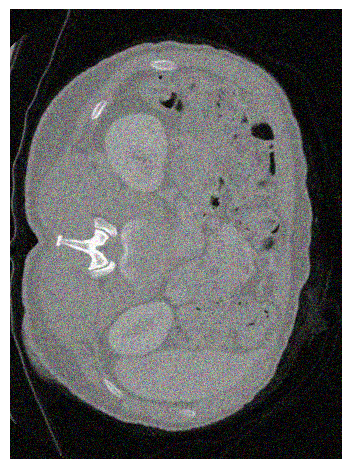

Top pixel: (3, 29, 0)
Image Size (WxH) in prompt: (332, 450), File Size: 376547 bytes


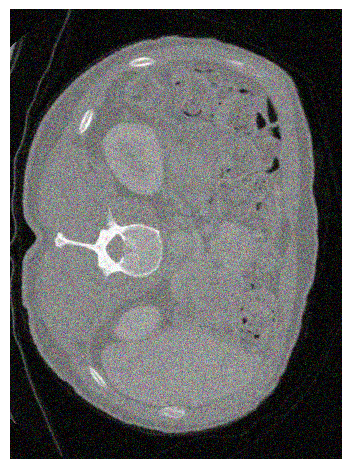

Top pixel: (38, 9, 0)
Image Size (WxH) in prompt: (332, 450), File Size: 378516 bytes


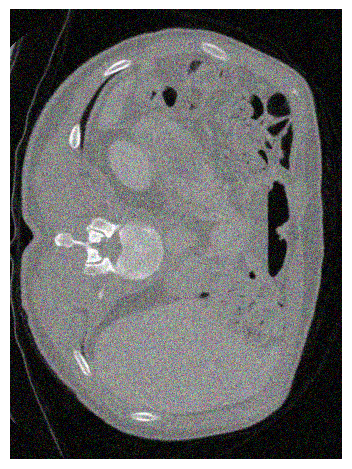

Top pixel: (12, 30, 2)
Image Size (WxH) in prompt: (332, 450), File Size: 384677 bytes


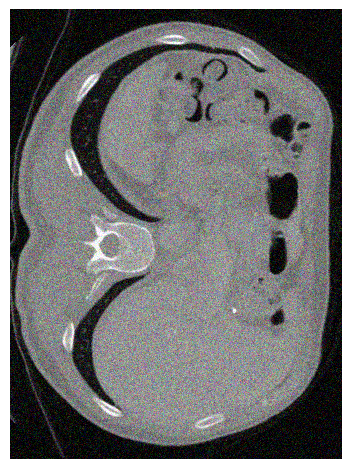

Top pixel: (33, 10, 0)
Image Size (WxH) in prompt: (332, 450), File Size: 389849 bytes


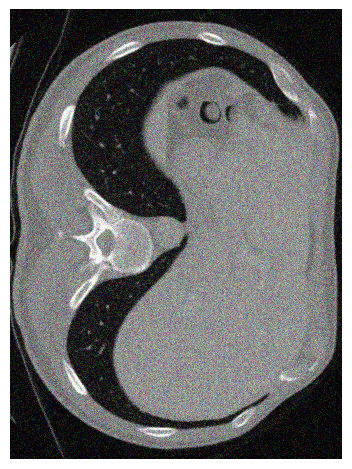

Top pixel: (0, 0, 19)
Image Size (WxH) in prompt: (332, 450), File Size: 390249 bytes

📌 Patient BDMAP_00000192 response:
The image quality of these CT scans appears to be quite poor. The images are grainy, and the details are not clear. The contrast and resolution are low, making it difficult to discern specific structures or abnormalities. Based on these observations, I would give the image quality a score of 2 out of 5.

img_file_list: ['/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000225/BDMAP_00000225_slice1.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000225/BDMAP_00000225_slice2.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000225/BDMAP_00000225_slice3.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000225/BDMAP_00000225_slice4.png', '/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy/BDMAP_00000225/BDMAP_00000225_slice5.png']


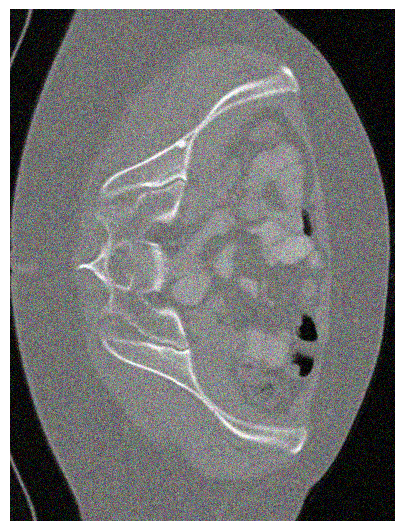

Top pixel: (13, 0, 0)
Image Size (WxH) in prompt: (385, 512), File Size: 526082 bytes


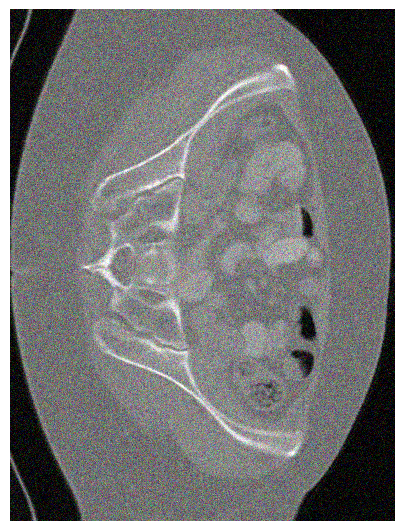

Top pixel: (41, 33, 9)
Image Size (WxH) in prompt: (385, 512), File Size: 526157 bytes


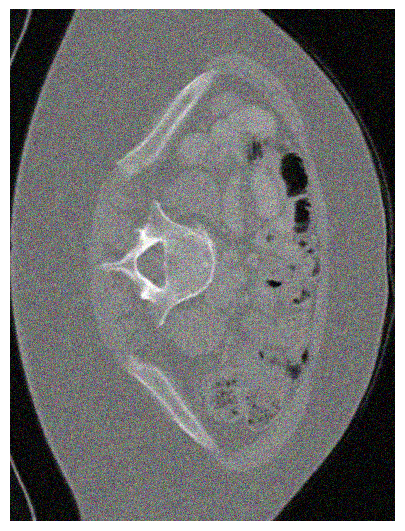

Top pixel: (34, 0, 44)
Image Size (WxH) in prompt: (385, 512), File Size: 525300 bytes


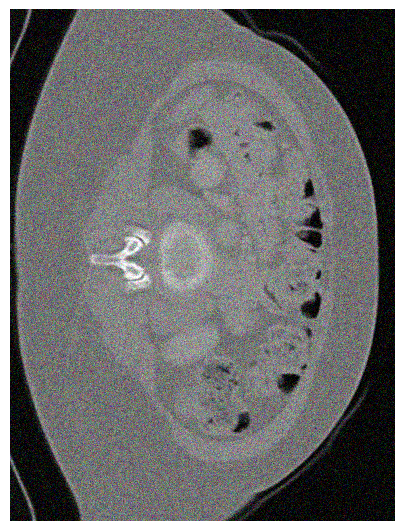

Top pixel: (0, 0, 20)
Image Size (WxH) in prompt: (385, 512), File Size: 521870 bytes


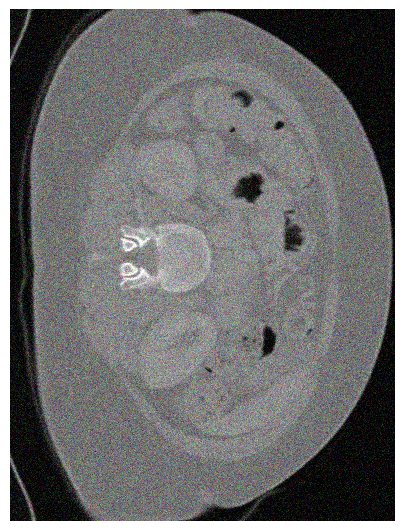

Top pixel: (0, 0, 0)
Image Size (WxH) in prompt: (385, 512), File Size: 521493 bytes

📌 Patient BDMAP_00000225 response:
The image quality in the provided images appears to be quite poor. The images are grainy, and the details are not clear. The contrast and resolution seem to be low, making it difficult to discern specific features or structures.

Here is a brief assessment of each image:

1. **First Image**: The image is grainy and lacks clear details. The contrast is low, making it hard to distinguish specific features.
2. **Second Image**: Similar to the first image, this one is also grainy and lacks clear details. The contrast is not sufficient to make out specific structures.
3. **Third Image**: This image is slightly clearer than the first two, but it still has a low resolution and poor contrast. The details are not very sharp.
4. **Fourth Image**: The image is grainy, and the details are not clear. The contrast is low, making it difficult to distinguish specific features.
5. **

In [8]:
import os
from glob import glob

base_dir = "/home/ubuntu/Touchstone/data/mvp_ct_slices_noisy"  # 🔁 update this
patient_dirs = sorted(os.listdir(base_dir))

for patient_id in patient_dirs:
    slice_paths = sorted(glob(os.path.join(base_dir, patient_id, "*.png")))
    
    if len(slice_paths) == 0:
        print(f"⚠️ No slices found for {patient_id}")
        continue

    conversation = CreateConversation(
        img_file_list=slice_paths,
        text="Give score 1–5, how good is the image quality?",
        conver=[]
    )

    payload = {
        "model": "Qwen/Qwen2-VL-72B-Instruct-AWQ",
        "messages": conversation,
        "temperature": 0.2  # Keep this 0.2
    }

    response = requests.post(vllm_url, json=payload)
    try:
        response.raise_for_status()
        content = response.json()["choices"][0]["message"]["content"]
        print(f"\n📌 Patient {patient_id} response:\n{content}\n")
    except requests.exceptions.HTTPError as e:
        print(f"\n❌ Error for patient {patient_id}: {e}")
        print(response.text)

## Model performs well with Noise added

Scores images in 1 or 2/5